In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import cv2
import seaborn as sns

In [2]:
from keras.models import Sequential
from keras.models import Model
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.core import Activation
from keras.layers.core import Flatten
from keras.layers.core import Dense
from keras.layers.core import Dropout
from keras.layers import BatchNormalization
from keras.preprocessing.image import ImageDataGenerator
import keras as K
import tensorflow as tf

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam,SGD,RMSprop

from skimage import io
import matplotlib.pyplot as plt

In [3]:
url = 'https://github.com/ieee8023/deep-learning-datasets/tree/master/chihuahua-muffin'

!git clone https://github.com/ieee8023/deep-learning-datasets.git


Cloning into 'deep-learning-datasets'...
remote: Enumerating objects: 53, done.
remote: Total 53 (delta 0), reused 0 (delta 0), pack-reused 53
Unpacking objects: 100% (53/53), done.


In [4]:
# install chromium, its driver, and selenium
!apt-get update -y
!apt install chromium-chromedriver -y
!cp /usr/lib/chromium-browser/chromedriver /usr/bin
!pip install selenium
# set options to be headless, ..


Hit:1 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:3 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:4 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:7 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Get:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [696 B]
Get:9 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Err:10 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
  404  Not Found [IP: 152.195.19.142 443]
Get:11 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [836 B]
Hit:

In [5]:
!apt-get update -y

!apt-get install -y libglib2.0-0=2.50.3-2 \
    libnss3=2:3.26.2-1.1+deb9u1 \
    libgconf-2-4=3.2.6-4+b1 \
    libfontconfig1=2.11.0-6.7+b1

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Hit:3 http://security.ubuntu.com/ubuntu bionic-security InRelease
Hit:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Ign:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:6 http://archive.ubuntu.com/ubuntu bionic InRelease
Hit:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Err:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
  404  Not Found [IP: 152.195.19.142 443]
Hit:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:11 http://archive.ubuntu.com/ubuntu bionic-backports InRelease
Hit:12 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:13 http://ppa.launchp

In [6]:

train_ciwawa = glob.glob('/content/deep-learning-datasets/chihuahua-muffin/chihuahua-*.jpg')
train_muffin = glob.glob('/content/deep-learning-datasets/chihuahua-muffin/muffin-*.jpeg')


labels = ['ciwawa','muffin']

x=[]
y=[]

X_test = []
y_test = []


# print('length ciwawa',len(train_ciwawa))
for i in range(len(train_ciwawa)):
  url = train_ciwawa[i]
  image = io.imread(url)

  image = cv2.resize(image,(170,170))
  X_test.append(image)
  y_test.append(0)

for i in range(len(train_muffin)):
  url = train_muffin[i]
  image = io.imread(url)

  image = cv2.resize(image,(170,170))

  X_test.append(image)
  y_test.append(1)


In [7]:
"""
Francesco Gerratana 2022, www.nextechnics.com
Simple example web scrape with python 3 and Selenium 4.1.3 + ChromeDriver 99.0.4844.51,
Run before pip install to install the necessary packages
"""
import time
import os
import urllib
import urllib.request
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options

chrome_options = Options()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')

with webdriver.Chrome(options=chrome_options) as driver:

  driver.get('https://images.google.com/');
  time.sleep(5)

  try:
    bt = driver.find_element(by=By.ID, value='L2AGLb')
    bt.click()
    time.sleep(0.2)
  except:
    pass
    
  search_box = driver.find_element(by=By.NAME, value='q')
  search_box.send_keys('Muffin')
  search_box.submit()
  time.sleep(0.2)
    
    # dest = os.path.join(os.getcwd(),"img")
    # if not os.path.exists(dest):
    #     os.makedirs(dest)
   
  dest = '/content/deep-learning-datasets/chihuahua-muffin/google-muffin/'
  if not os.path.exists(dest):
        os.makedirs(dest)

  counter=0
  salvate=0

  for _ in range(8): # numero di scroll
      driver.execute_script("window.scrollBy(0,1000000)")      
  
      for d in driver.find_elements(by=By.XPATH, value='//img[contains(@class,"rg_i Q4LuWd")]'):
          
          counter = counter + 1
        
          if not d.get_attribute('src') == "": 
            url = d.get_attribute('src')            
            new_filename = dest+"\img-"+str(counter)+".jpg"
                
            try:
              urllib.request.urlretrieve(url, new_filename)
              salvate += 1
            except Exception as e:
              # print(e)
              pass

      time.sleep(0.2)

  print('trovate:'+str(counter)+' salvate:'+str(salvate))      
   
  driver.quit()



trovate:2300 salvate:1126


In [8]:
"""
Francesco Gerratana 2022, www.nextechnics.com
Simple example web scrape with python 3 and Selenium 4.1.3 + ChromeDriver 99.0.4844.51,
Run before pip install to install the necessary packages
"""
import time
import os
import urllib
import urllib.request
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options

chrome_options = Options()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')

with webdriver.Chrome(options=chrome_options) as driver:

  driver.get('https://images.google.com/');
  time.sleep(5)

  try:
    bt = driver.find_element(by=By.ID, value='L2AGLb')
    bt.click()
    time.sleep(0.2)
  except:
    pass

  search_box = driver.find_element(by=By.NAME, value='q')
  search_box.send_keys('Chihuahua dog')
  search_box.submit()
  time.sleep(0.2)

  counter = 0
  salvate = 0
    
    # dest = os.path.join(os.getcwd(),"img")
    # if not os.path.exists(dest):
    #     os.makedirs(dest)
   
  dest = '/content/deep-learning-datasets/chihuahua-muffin/google-cihuahua/'
  if not os.path.exists(dest):
        os.makedirs(dest)

  for _ in range(8): # numero di scroll
      driver.execute_script("window.scrollBy(0,100000)")    
  
      for d in driver.find_elements(by=By.XPATH, value='//img[contains(@class,"rg_i Q4LuWd")]'):
          
          counter = counter + 1
        
          if not d.get_attribute('src') == "": 
            url = d.get_attribute('src')            
            new_filename = dest+"\img-"+str(counter)+".jpg"
                
            try:
              urllib.request.urlretrieve(url, new_filename)
              salvate += 1
            except Exception as e:
              # print(e)
              pass

      time.sleep(0.2)

  print('trovate:'+str(counter)+' salvate:'+str(salvate))

  driver.quit()



trovate:2248 salvate:1057


In [44]:
google_ciwawa = glob.glob('/content/deep-learning-datasets/chihuahua-muffin/google-cihuahua/*.jpg')

for i in range(len(google_ciwawa)):
  url = google_ciwawa[i]
  image = io.imread(url) # qui hai il problema devi convertire in BGR
  # print(google_ciwawa[i])
  # print(image.shape)

  if len(image.shape)==3:
      image = cv2.resize(image,(170,170))
      x.append(image)
      y.append(0)

#print(len(x))

AttributeError: ignored

In [10]:
google_muffin = glob.glob('/content/deep-learning-datasets/chihuahua-muffin/google-muffin/*.jpg')

for i in range(len(google_muffin)):
  url = google_muffin[i]
  image = io.imread(url) # qui hai il problema

  # print(google_muffin[i])
  # print(image.shape)
  if len(image.shape)==3:
    image = cv2.resize(image,(170,170))
    x.append(image)
    y.append(1)

#print(len(x))

In [11]:
x = np.asarray(x)  
x= x / 255
y = np.asarray(y)


X_test = np.asarray(X_test)
X_test = X_test / 255
y_test = np.asarray(y_test)

In [12]:
print(len(x))

2183


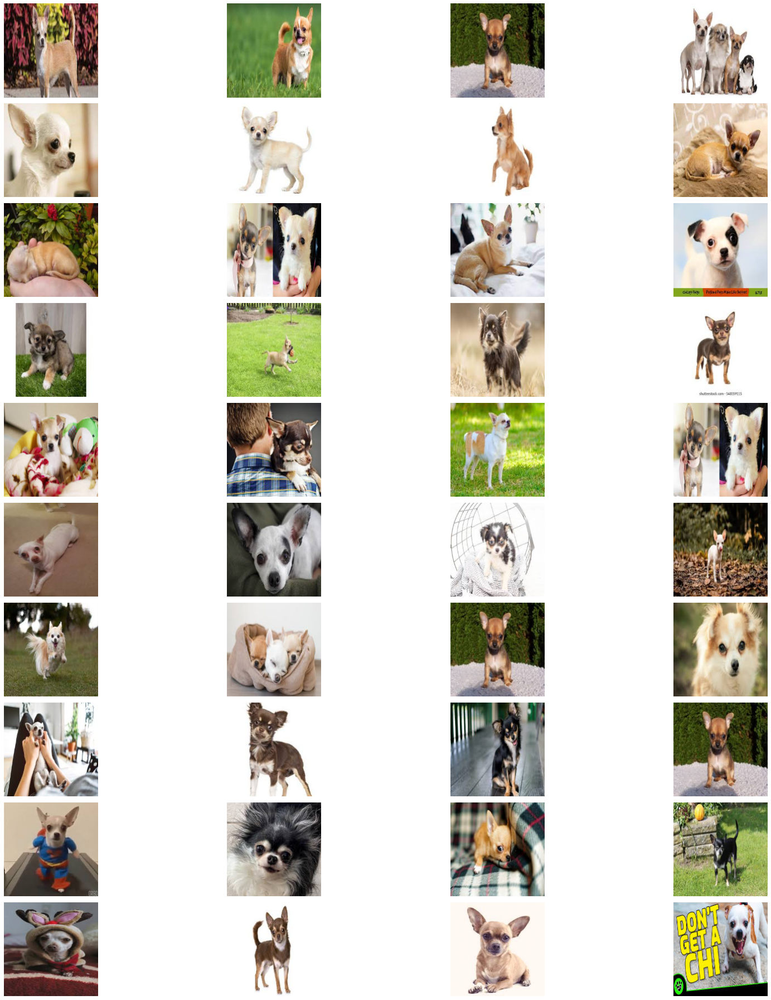

In [13]:
fig = plt.figure(figsize=(25, 25))

columns = 4
rows = 10

total_pics = columns*rows

for i in range(total_pics):
  if(i <total_pics):
    ax = fig.add_subplot(rows, columns, i+1)

  plt.imshow(x[i])
  plt.axis('off')
plt.tight_layout()

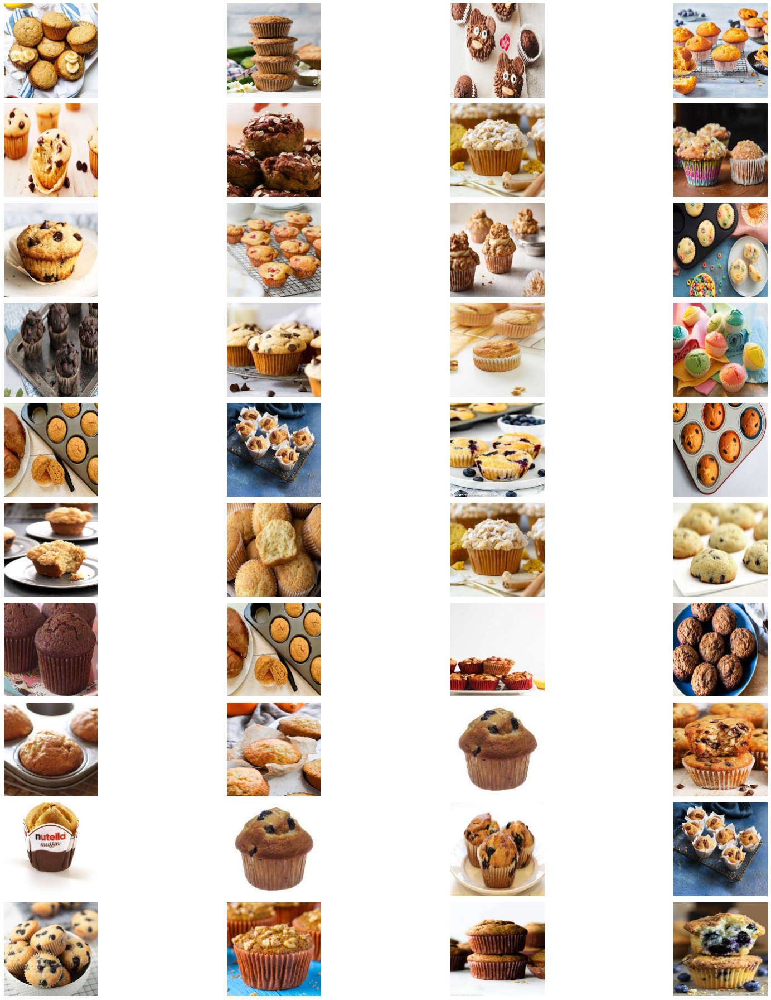

In [14]:
fig = plt.figure(figsize=(25, 25))

columns = 4
rows = 10

total_pics = columns*rows

res = x[-total_pics:]

for i in range(len(res)):
  if(i <total_pics):
    ax = fig.add_subplot(rows, columns, i+1)

  plt.imshow(res[i])
  plt.axis('off')
plt.tight_layout()



In [15]:

checkPoint=ModelCheckpoint("model.h5", save_weights_only=False, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
earlyStopping=EarlyStopping(monitor='val_loss', min_delta = 0.01, patience=15, verbose=0, mode='min') 
# earlyStopping=EarlyStopping(monitor='loss', min_delta = 0, patience=10, verbose=1, mode='min', restore_best_weights = True) 

lrr = ReduceLROnPlateau(monitor='val_accuracy', patience=3, verbose=1, factor=0.5, min_lr=2.5e-5)
# reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2,patience=5, min_lr=0.001)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', patience = 2, verbose=1,factor=0.3, min_lr=0.0001)


In [16]:
shape = (170, 170, 3)
target_size = (170, 170)

input_tensor = K.Input(shape=shape)
adam = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.9999, decay=0.0)


def create_model():   

  model = Sequential(
          [   
              # K.layers.Lambda(lambda image: tf.image.resize(image, target_size)),
              Conv2D(3, (3,3), padding="same", input_shape=shape, activation='relu'),
              Conv2D(3, (3,3), padding="same", activation='relu'),
              Conv2D(3, (1,1), padding="same", activation='relu'),
              BatchNormalization(),
              Conv2D(6, (3,3), activation='relu', strides=3),

              Conv2D(6, (3,3), padding="same", activation='relu'),
              Conv2D(6, (3,3), padding="same", activation='relu'),
              Conv2D(6, (1,1), padding="same", activation='relu'),
              BatchNormalization(),
              MaxPooling2D(pool_size=(2, 2)),
              Dropout(0.25),

              Flatten(),
              Dense(6,activation='relu'),
              BatchNormalization(),
              Dropout(0.5),
              Dense(1,activation='sigmoid')

          ], name="my-net"
      )
  model.compile(loss='binary_crossentropy', optimizer=adam, metrics = ['accuracy'])
  model.build((None,170,170,3))
  return model
  

In [17]:
model = create_model()
model.summary()

Model: "my-net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 170, 170, 3)       84        
                                                                 
 conv2d_1 (Conv2D)           (None, 170, 170, 3)       84        
                                                                 
 conv2d_2 (Conv2D)           (None, 170, 170, 3)       12        
                                                                 
 batch_normalization (BatchN  (None, 170, 170, 3)      12        
 ormalization)                                                   
                                                                 
 conv2d_3 (Conv2D)           (None, 56, 56, 6)         168       
                                                                 
 conv2d_4 (Conv2D)           (None, 56, 56, 6)         330       
                                                            

In [18]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(x, y, test_size=0.2, random_state=1)

# X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1)
# X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2

In [19]:
from keras.preprocessing.image import ImageDataGenerator


train_datagen = ImageDataGenerator(   shear_range = 0.2,
                                  zoom_range = 0.5,
                                  height_shift_range=0.2,
                                  width_shift_range=0.2,
                                  fill_mode='nearest',
                                  horizontal_flip=True,
                                  rotation_range = 20, 
                            
                               )


validation_datagen = ImageDataGenerator()

train_generator = train_datagen.flow(X_train, y_train, batch_size=6)
validation_generator = validation_datagen.flow(X_val,y_val, batch_size=6)


In [20]:
history = model.fit(train_generator,    
                    validation_data= validation_generator,
                    validation_steps=len(X_val) // 6,
                    steps_per_epoch=len(X_train) // 6,
                    epochs=200,
                    callbacks = [lrr,checkPoint,earlyStopping],
                    shuffle=True,
                    verbose=2)
model.save('last.h5')

Epoch 1/200

Epoch 1: val_accuracy improved from -inf to 0.43981, saving model to model.h5
291/291 - 24s - loss: 0.8790 - accuracy: 0.5132 - val_loss: 0.7355 - val_accuracy: 0.4398 - lr: 1.0000e-04 - 24s/epoch - 81ms/step
Epoch 2/200

Epoch 2: val_accuracy improved from 0.43981 to 0.57176, saving model to model.h5
291/291 - 12s - loss: 0.8599 - accuracy: 0.5326 - val_loss: 0.6662 - val_accuracy: 0.5718 - lr: 1.0000e-04 - 12s/epoch - 40ms/step
Epoch 3/200

Epoch 3: val_accuracy improved from 0.57176 to 0.69213, saving model to model.h5
291/291 - 12s - loss: 0.7811 - accuracy: 0.5716 - val_loss: 0.6168 - val_accuracy: 0.6921 - lr: 1.0000e-04 - 12s/epoch - 40ms/step
Epoch 4/200

Epoch 4: val_accuracy improved from 0.69213 to 0.70833, saving model to model.h5
291/291 - 12s - loss: 0.7697 - accuracy: 0.5527 - val_loss: 0.5831 - val_accuracy: 0.7083 - lr: 1.0000e-04 - 12s/epoch - 40ms/step
Epoch 5/200

Epoch 5: val_accuracy improved from 0.70833 to 0.73148, saving model to model.h5
291/291 -

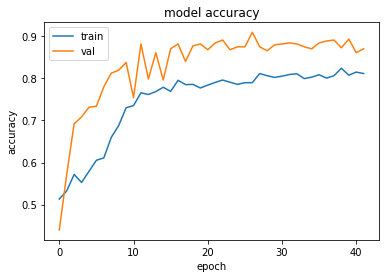

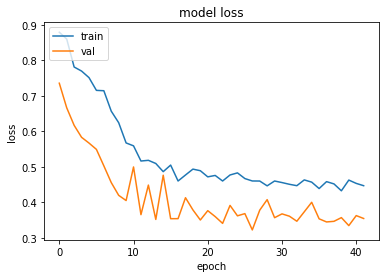

last model accuracy 0.8703703880310059
best model accuracy 0.9097222089767456


In [21]:
import matplotlib.pyplot as plt
import numpy as np


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

index = np.argmax(history.history['val_accuracy'])

print('last model accuracy',history.history['val_accuracy'][-1])
print('best model accuracy',history.history['val_accuracy'][index])



In [22]:
modelx = K.models.load_model("model.h5")


In [23]:
# model = K.models.load_model("last.h5")

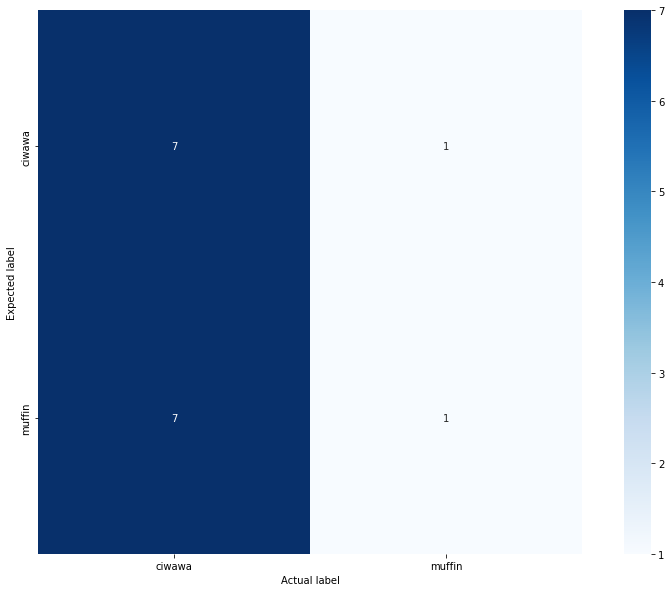

              precision    recall  f1-score   support

      ciwawa       0.50      0.88      0.64         8
      muffin       0.50      0.12      0.20         8

    accuracy                           0.50        16
   macro avg       0.50      0.50      0.42        16
weighted avg       0.50      0.50      0.42        16



,predictions,actual_values
0,ciwawa,ciwawa
1,muffin,ciwawa
2,ciwawa,ciwawa
3,ciwawa,ciwawa
4,ciwawa,ciwawa


,predictions,actual_values
1,muffin,ciwawa
8,ciwawa,muffin
9,ciwawa,muffin
10,ciwawa,muffin
12,ciwawa,muffin


n° of failing predictions: 8
accuracy: 0.5


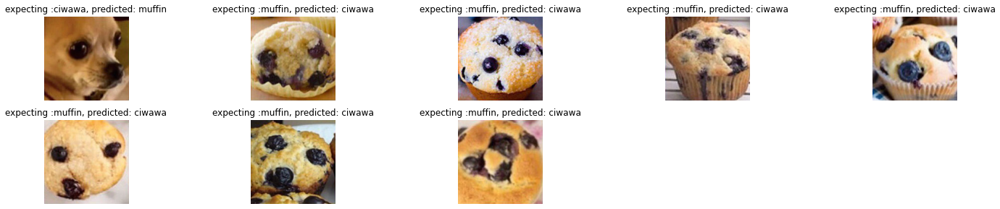

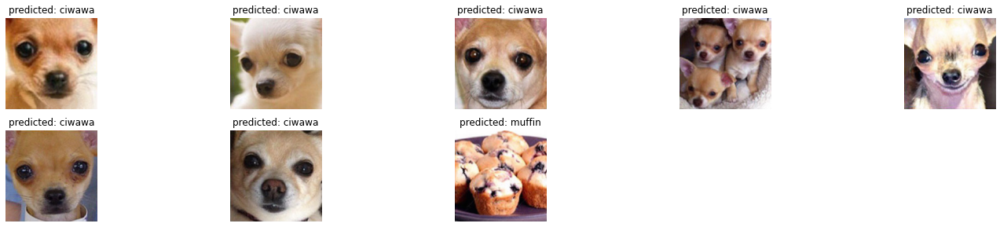

In [24]:
from sklearn.metrics import confusion_matrix,classification_report
import pandas as pd
import seaborn as sns
import tensorflow.keras as K

# labels = ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

pred = modelx.predict(X_test)

# print(pred[:,0])

predictions = (np.round(pred[:,0]))

# print(len(predictions))
# print(len(y_test))


df = pd.DataFrame({'predictions':predictions,'actual_values':y_test})

df['predictions']=df['predictions'].apply(lambda x: labels[int(x)] )
df['actual_values']=df['actual_values'].apply(lambda x: labels[x] ) 

expected = df['predictions'].to_numpy()
actual = df['actual_values'].to_numpy()

# # print(expected[:10])
# # print(actual[:10])

cm=confusion_matrix(actual,expected)

plt.figure(figsize=[15, 10])
sns.heatmap(data=cm, annot=True, cmap='Blues', square=True, xticklabels=labels, yticklabels=labels)
plt.xlabel('Actual label')
plt.ylabel('Expected label')
plt.show()

print( classification_report(actual,expected))

display(df.head())

failings = df[df['predictions']!=df['actual_values']]
corrects = df[df['predictions']==df['actual_values']]

display(failings.head())

failing_predictions = len(failings)

print('n° of failing predictions:',failing_predictions)
# print(failings.index[0])
total_data = len(df)

print('accuracy:',1 - failing_predictions / total_data)
# print('accuracy:',model.evaluate(X_test, y_test, batch_size=256))

fig = plt.figure(figsize=(20, 20))

columns = 5
rows = 10
total_pics = len(failings)
# print(failings.iloc[failings.index[0]])

# (X_train, y_train), (X_test, y_test) = K.datasets.cifar10.load_data()
for i in range(total_pics):
  if(i <total_pics):
    ax = fig.add_subplot(rows, columns, i+1)
  el = failings.iloc[i]
  ax.set_title('expecting :'+str(el.actual_values)+", predicted: "+str(el.predictions),fontsize=12)
  
  plt.imshow(X_test[failings.index[i]])
  plt.axis('off')
plt.tight_layout()

fig = plt.figure(figsize=(20, 20))

columns = 5
rows = 10
total_pics = len(corrects)

for i in range(total_pics):
  if(i <total_pics):
    ax = fig.add_subplot(rows, columns, i+1)
  el = corrects.iloc[i]
  ax.set_title("predicted: "+str(el.predictions),fontsize=12)
  
  plt.imshow(X_test[corrects.index[i]])
  plt.axis('off')
plt.tight_layout()

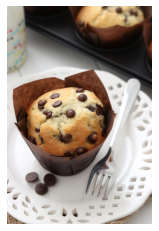

[[0.84119445]]
muffin


In [25]:
url_1 ='https://uitdekeukenvanfatima.nl/wp-content/uploads/2018/03/IMG_4654-2.jpg'

image_1 = io.imread(url_1)
plt.imshow(image_1)
plt.axis('off')
plt.show()

image_1 = cv2.resize(image_1,(170,170))
image_1 = image_1 /255
pred = modelx.predict(np.array([image_1]))

print(pred)

index = int(np.round(pred[0]))
print(labels[index])


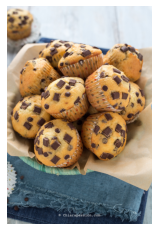

[[0.85423714]]
muffin


In [26]:
url = 'https://www.chiarapassion.com/wp-content/uploads/2019/01/ricetta-muffin-con-gocce-di-cioccolato.jpg'

image = io.imread(url)
plt.imshow(image)
plt.axis('off')
plt.show()

image = cv2.resize(image,(170,170))
image = image / 255
pred = modelx.predict(np.array([image]))

# index = np.argmax(pred)

index = int(np.round(pred[0]))
print(pred)
print(labels[index])

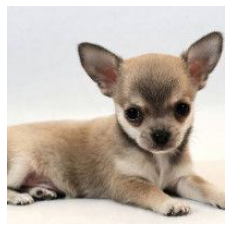

[[0.14076057]]
ciwawa


In [27]:
url = 'https://i.pinimg.com/236x/a7/f3/21/a7f3211d31c7f2b1572ba12105e61eac.jpg'

image = io.imread(url)
plt.imshow(image)
plt.axis('off')
plt.show()

image = cv2.resize(image,(170,170))
image = image /255

pred = modelx.predict(np.array([image]))

index = int(np.round(pred[0]))
print(pred)
# print(index)
print(labels[index])

[0.67298084]
muffin


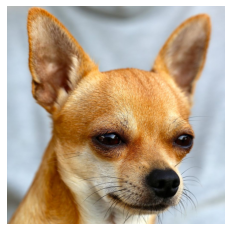

In [28]:
url = 'https://www.allevare.info/wp-content/uploads/2019/09/chihuahua-1.jpg'

image = io.imread(url)
plt.imshow(image)
plt.axis('off')


image = cv2.resize(image,(170,170))
image = image / 255
pred = modelx.predict(np.array([image]))

# index = np.argmax(pred)

index = int(np.round(pred[0]))

print(pred[0])
# print(index)
print(labels[index])

[0.09876102]
ciwawa


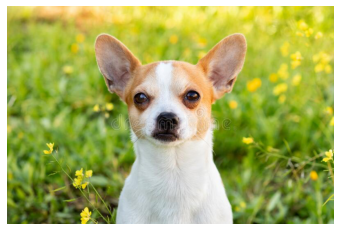

In [29]:
url_2 = 'https://thumbs.dreamstime.com/b/funny-white-chihuahua-big-ears-funny-white-chihuahua-big-ears-bloosom-meadow-169312889.jpg'

image = io.imread(url_2)
plt.imshow(image)
plt.axis('off')


image = cv2.resize(image,(170,170))
image = image / 255
pred = modelx.predict(np.array([image]))

# index = np.argmax(pred)

index = int(np.round(pred[0]))

print(pred[0])
# print(index)
print(labels[index])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 170, 170, 3)


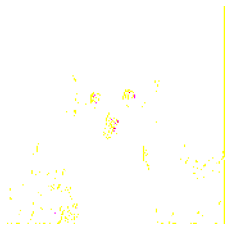

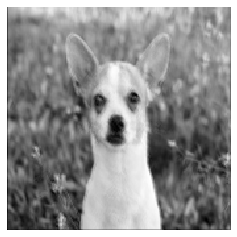

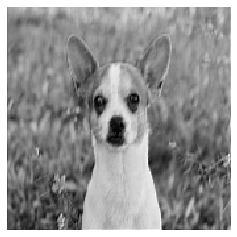

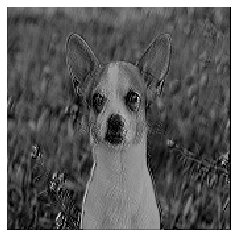

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 170, 170, 3)


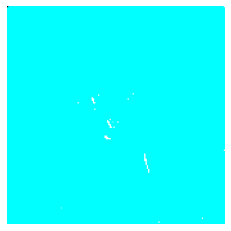

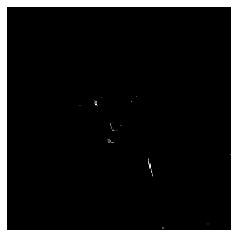

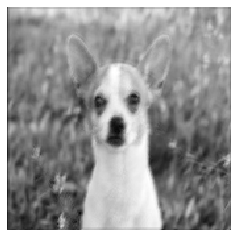

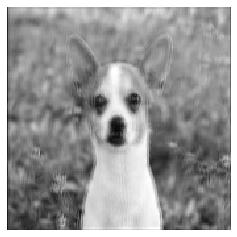

In [30]:
layer_outputs = [layer.output for layer in modelx.layers[:8]]
activation_model = Model(inputs=modelx.input, outputs=layer_outputs)

imagex = io.imread(url_2)
imagex = cv2.resize(imagex,(170,170))

imagex= np.expand_dims(imagex, axis=0)

activations = activation_model.predict(imagex) # feature of this picture
first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.imshow(first_layer_activation[0])
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 0], cmap='gray') # Viridis, percptual uniform colormap
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 1], cmap='gray') 
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 2], cmap='gray') 
plt.axis('off')
plt.show()

second_layer_activation = activations[1]
print(second_layer_activation.shape)

plt.imshow(second_layer_activation[0])
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 0], cmap='gray') 
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 1], cmap='gray') # Viridis, percptual uniform colormap
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 2], cmap='gray') 
plt.axis('off')
plt.show()

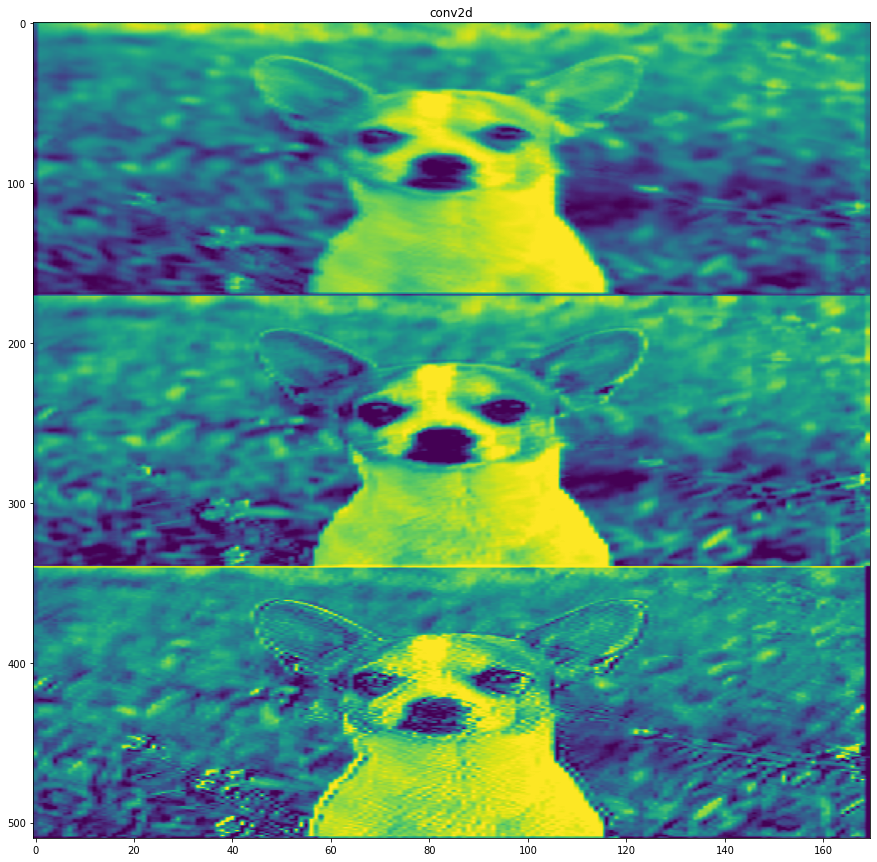

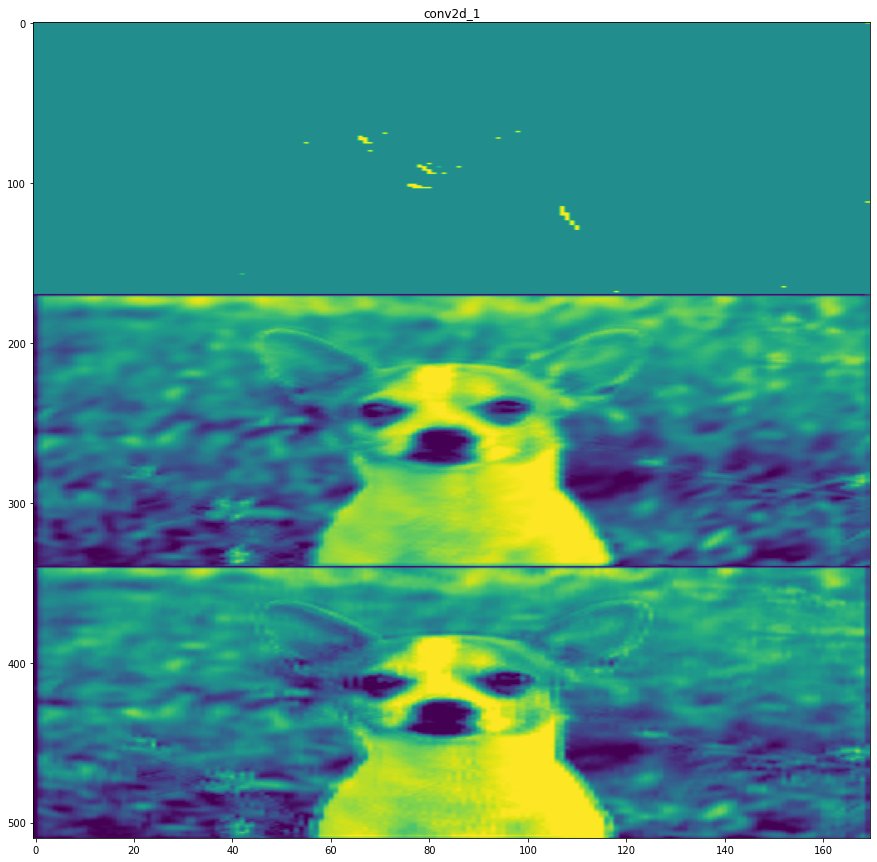

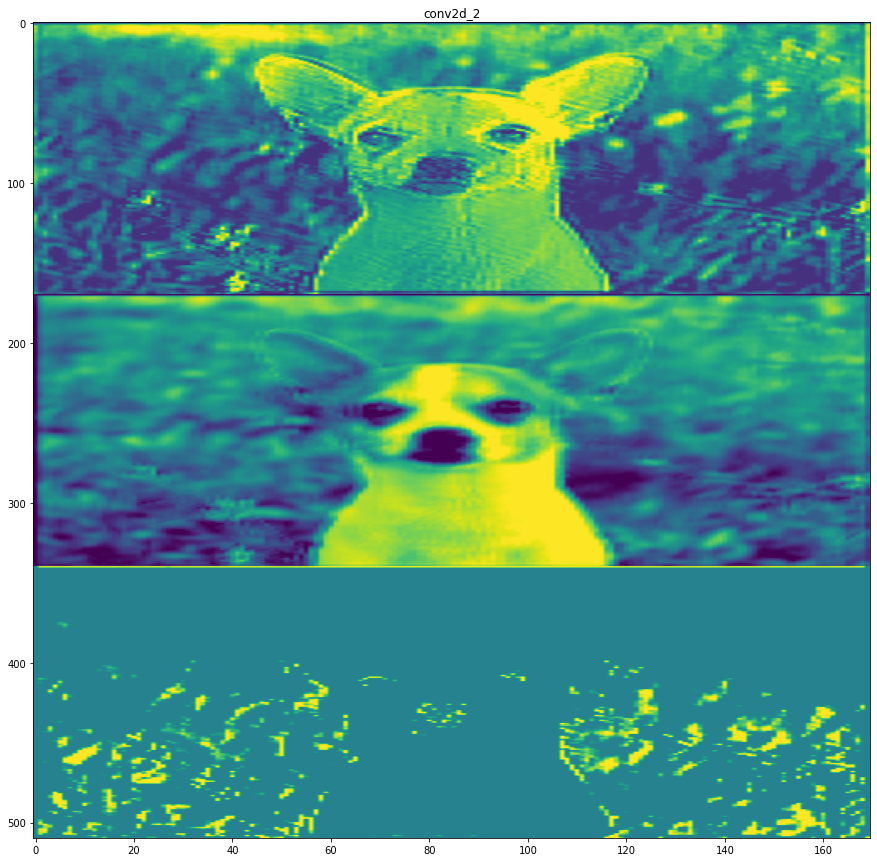

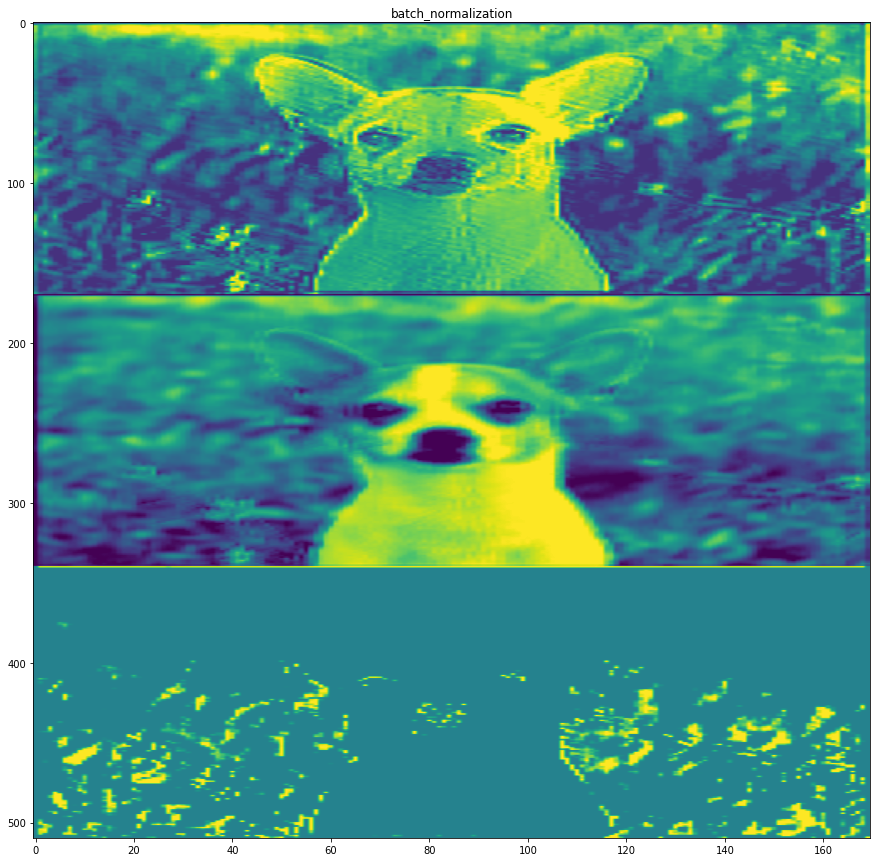

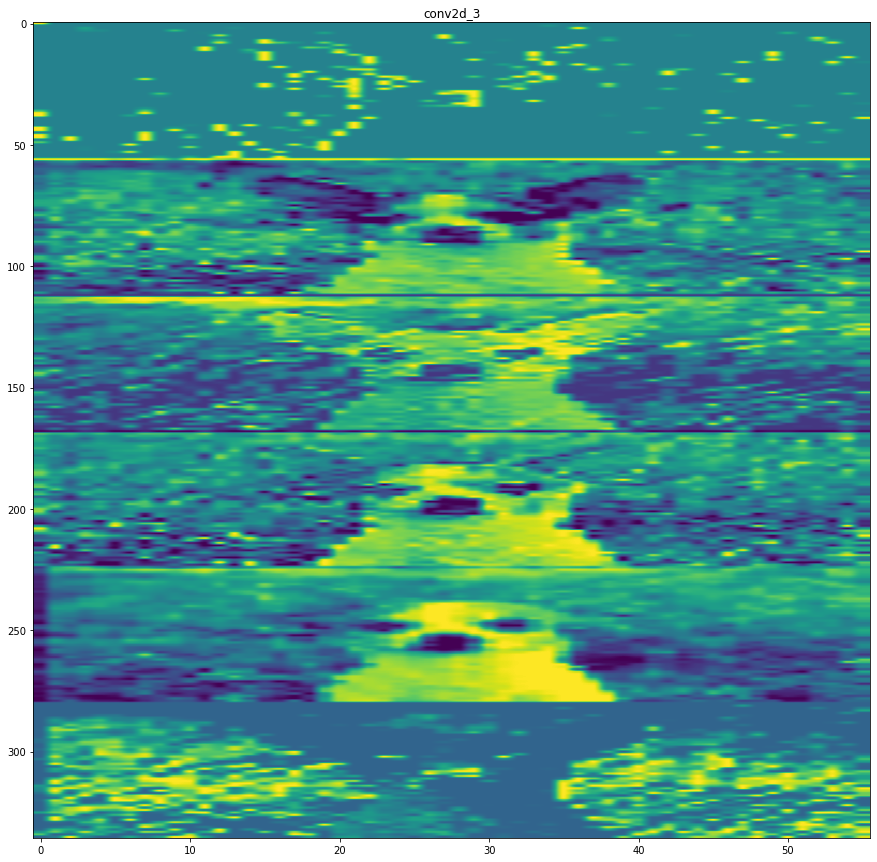

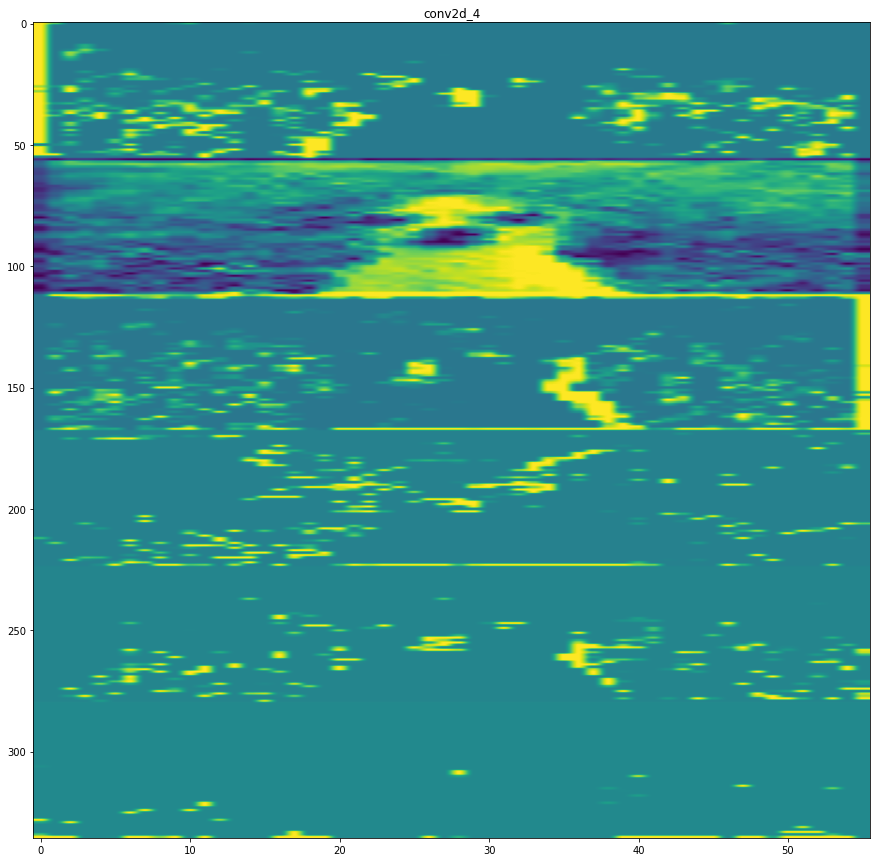

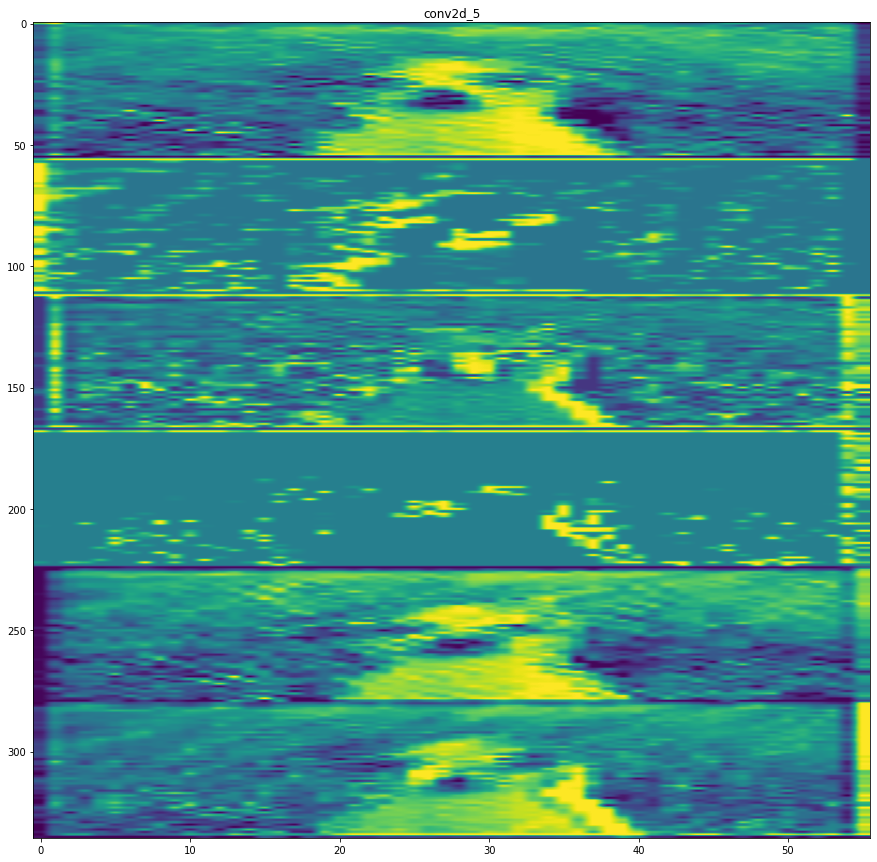

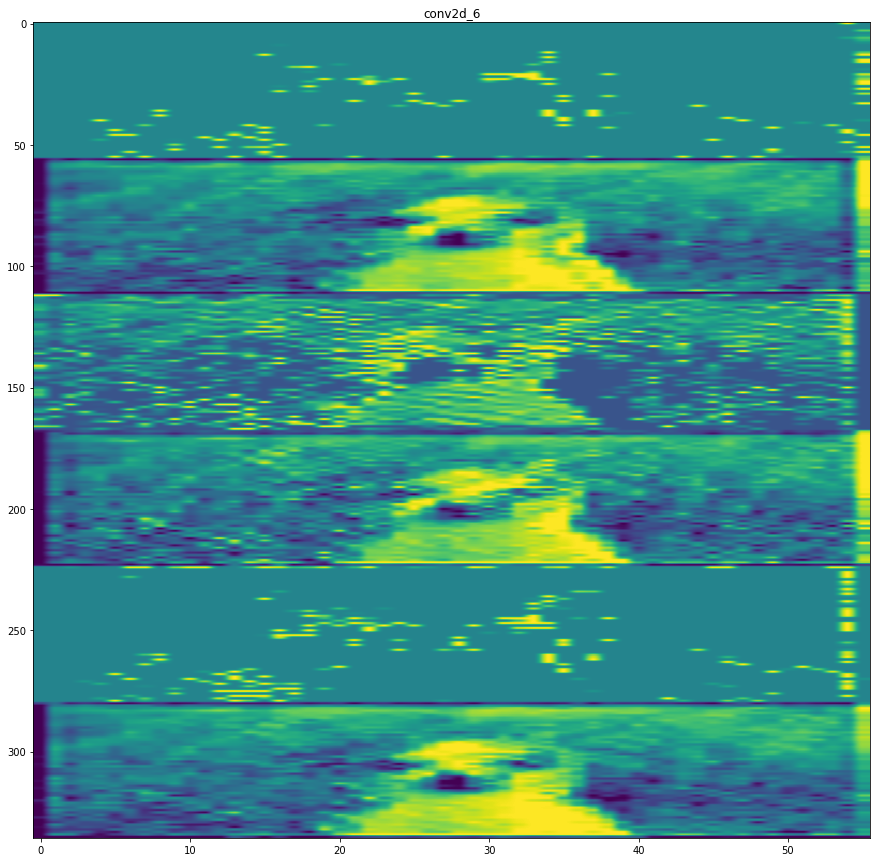

In [31]:
layer_names = []
for layer in modelx.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 1

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]

    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(15,15))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 170, 170, 3)


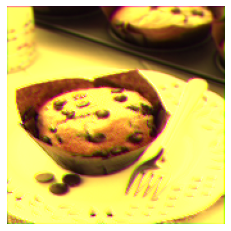

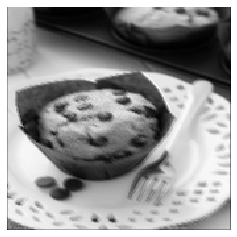

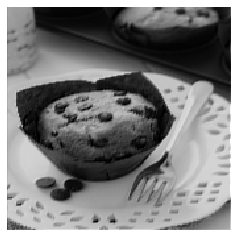

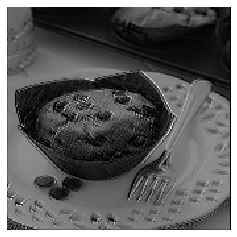

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 170, 170, 3)


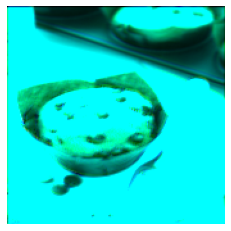

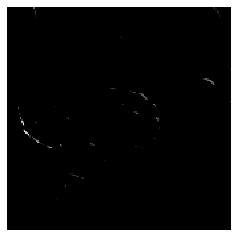

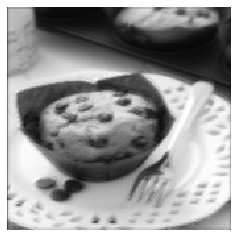

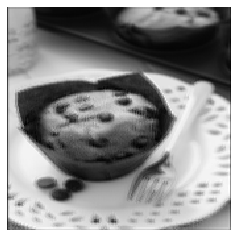

In [32]:
imagex = io.imread(url_1)
imagex = cv2.resize(imagex,(170,170))

imagex= np.expand_dims(imagex, axis=0)

imagex = imagex /255

activations = activation_model.predict(imagex) # feature of this picture
first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.imshow(first_layer_activation[0])
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 0], cmap='gray') # Viridis, percptual uniform colormap
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 1], cmap='gray') 
plt.axis('off')
plt.show()

plt.matshow(first_layer_activation[0, :, :, 2], cmap='gray') 
plt.axis('off')
plt.show()

second_layer_activation = activations[1]
print(second_layer_activation.shape)

plt.imshow(second_layer_activation[0])
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 0], cmap='gray') 
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 1], cmap='gray') # Viridis, percptual uniform colormap
plt.axis('off')
plt.show()

plt.matshow(second_layer_activation[0, :, :, 2], cmap='gray') 
plt.axis('off')
plt.show()

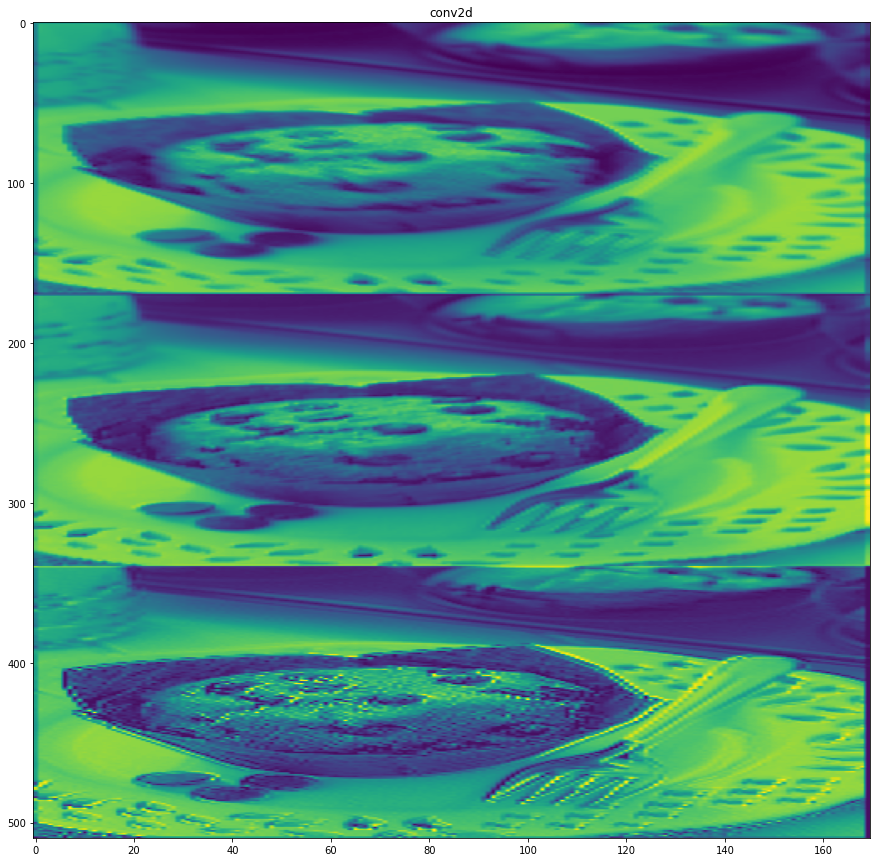

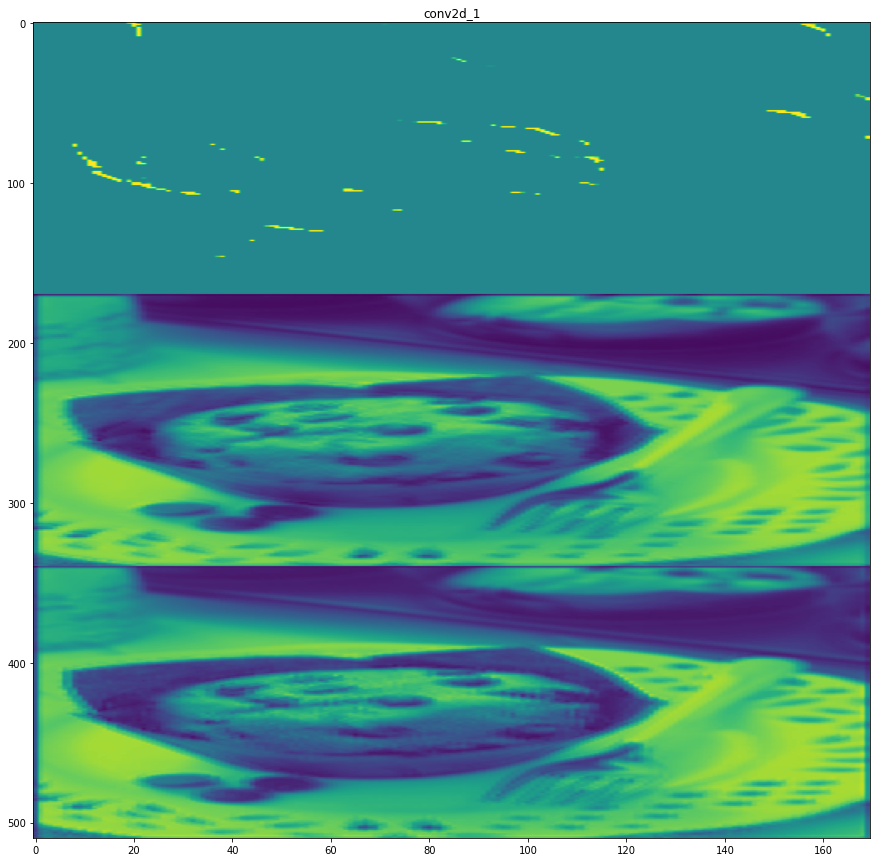

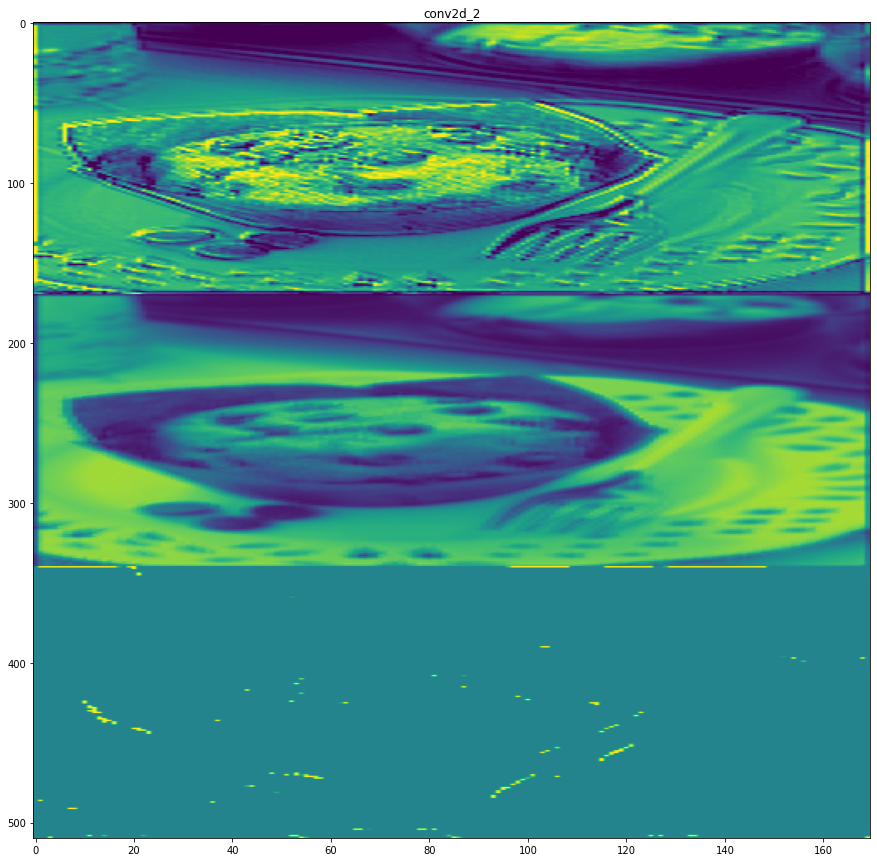

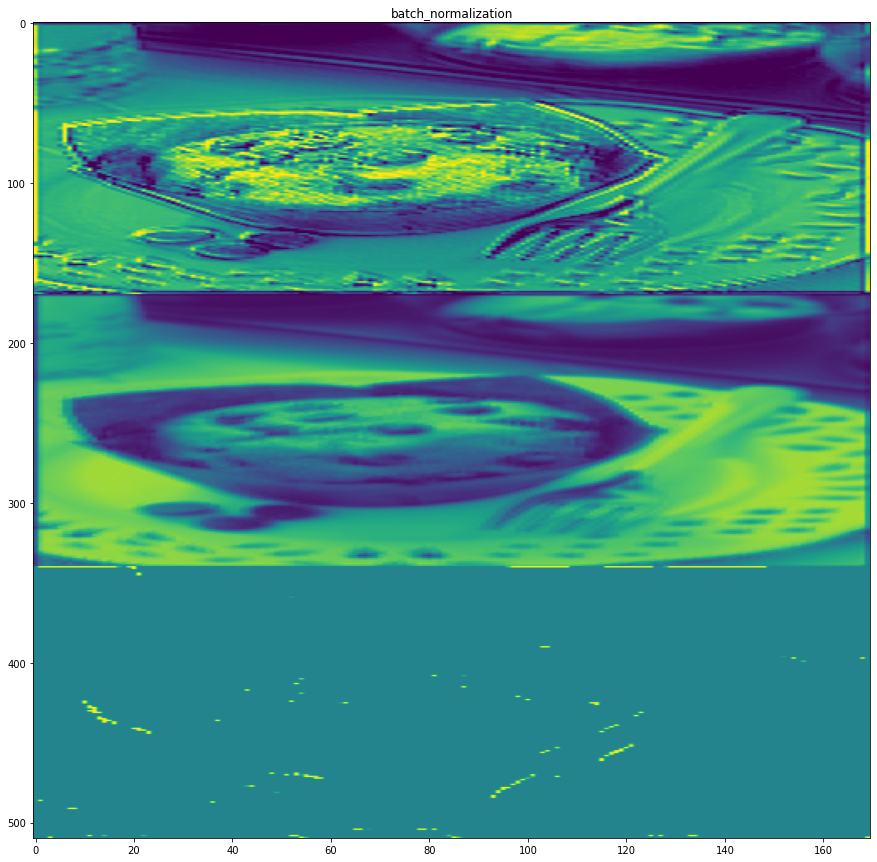

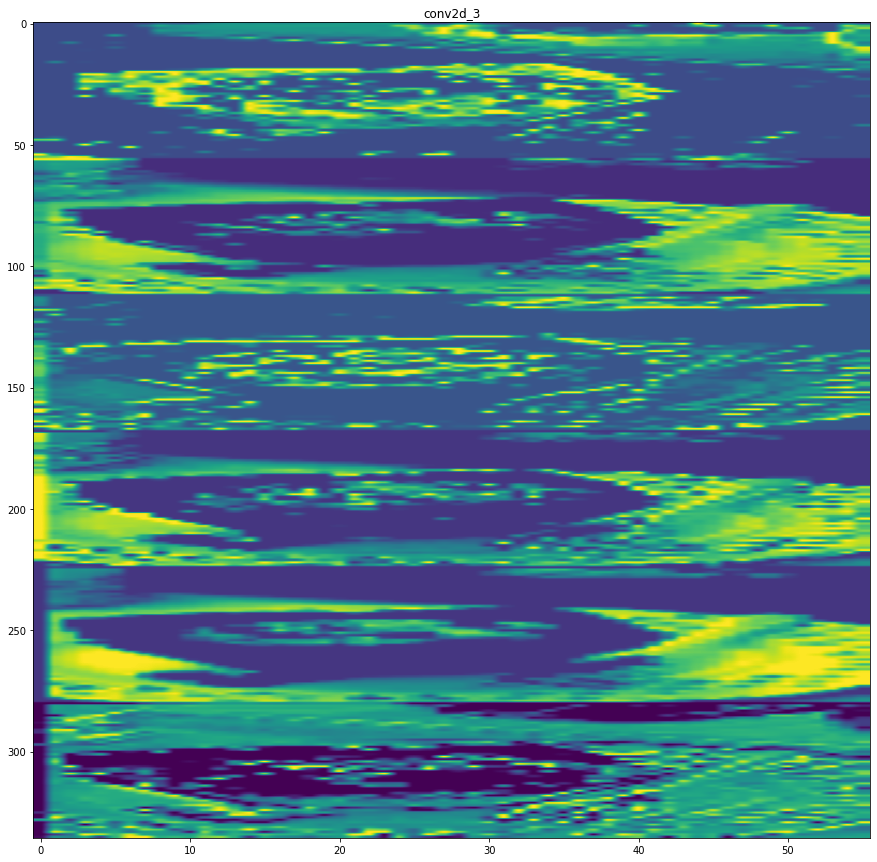

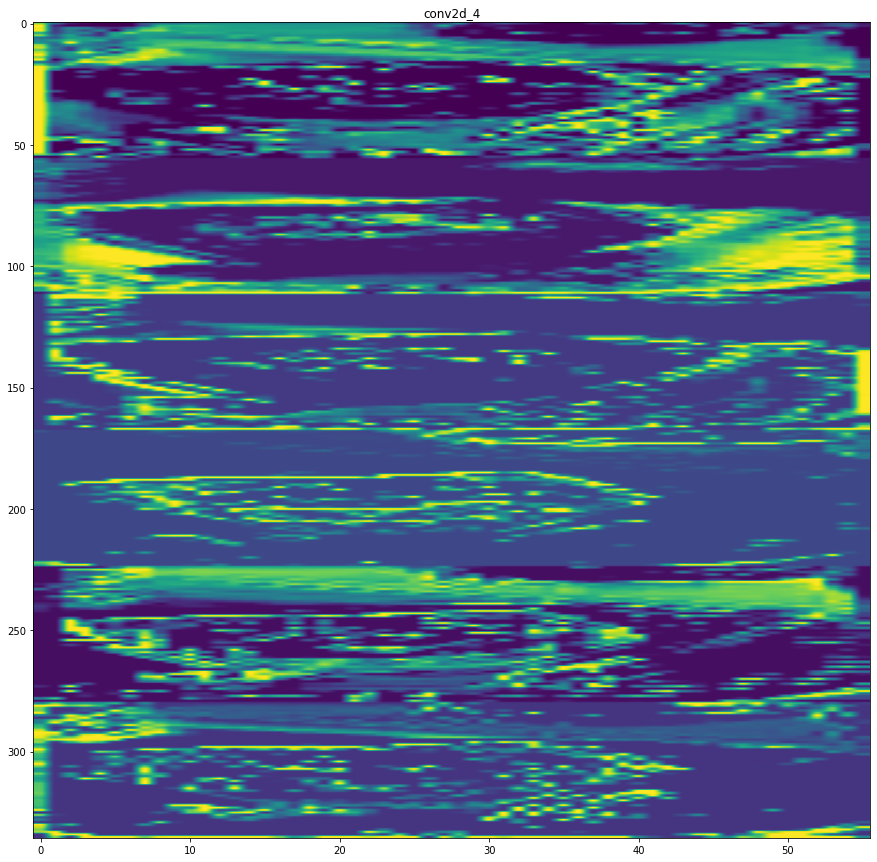

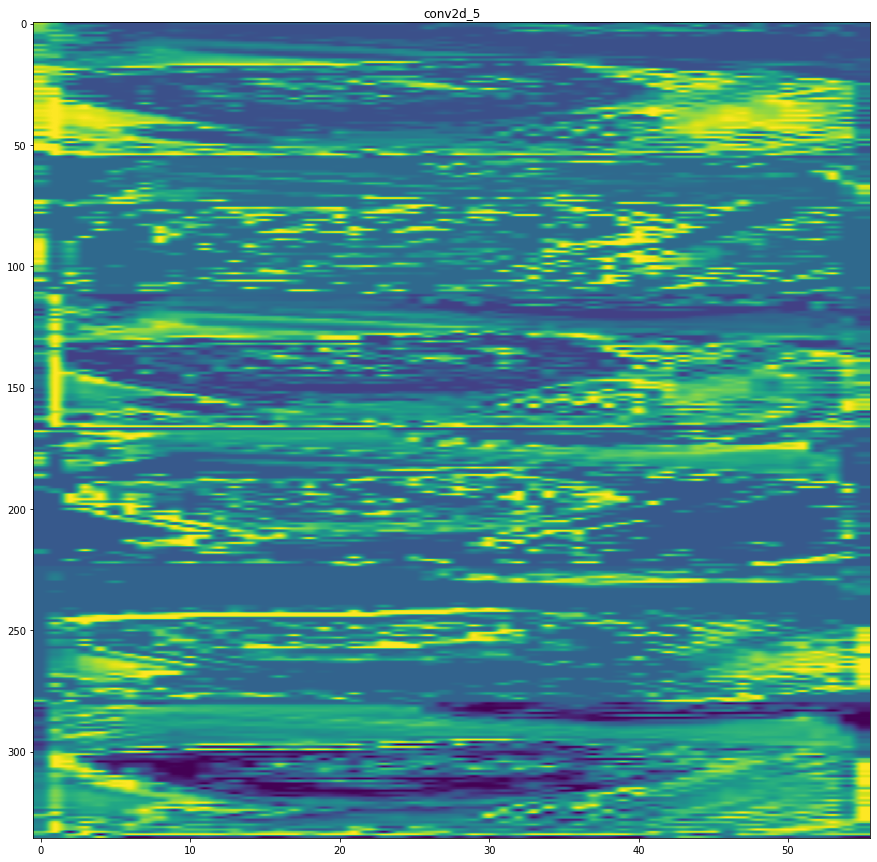

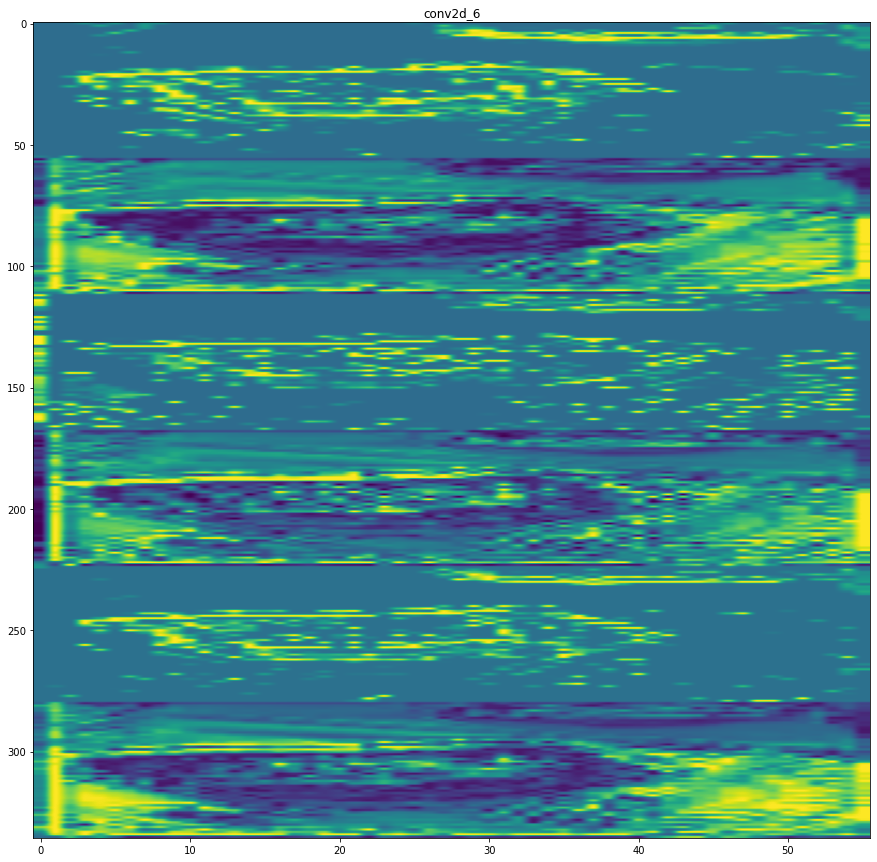

In [33]:
layer_names = []
for layer in modelx.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 1

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]

    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    scale = 1. / size
    plt.figure(figsize=(15,15))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
plt.show()

In [77]:
train_datagen = ImageDataGenerator(shear_range = 0.2,
                                  zoom_range = 0.5,
                                  height_shift_range=0.2,
                                  width_shift_range=0.2,
                                  fill_mode='nearest',
                                  horizontal_flip=True,
                                  rotation_range = 20, 
                            
                               )

val_datagen = ImageDataGenerator()
test_datagen = ImageDataGenerator()

batch_size = 8
train_generator  = train_datagen.flow(X_train, y_train, batch_size=batch_size)
validation_generator = val_datagen.flow(X_val, y_val, batch_size=batch_size)
test_generator  = test_datagen.flow(X_test,y_test, batch_size=batch_size)

In [78]:
def feature_extractor(ccn, generator, sample_count, test_batch_size):
    features = np.zeros(shape=(sample_count, 6, 6, 2048))
    labels = np.zeros(shape=(sample_count))

    i = 0
    for inputs_batch, labels_batch in generator:
        features_batch = cnn.predict(inputs_batch)
        features[i * test_batch_size : (i + 1) * test_batch_size] = features_batch
        labels[i * test_batch_size : (i + 1) * test_batch_size] = labels_batch
        i += 1
        if i * test_batch_size >= sample_count:
            break
    return features, labels


In [104]:
check_point = ModelCheckpoint("pre-trained-features.h5", save_weights_only = False, monitor = "val_accuracy", verbose = 1, save_best_only = True, mode = "max")
earlyStopping = EarlyStopping(monitor = 'val_loss', min_delta = 0.001, patience = 30, verbose = 0, mode = 'min') 
csv_logger = CSVLogger('history.log')
reduce_lr_plateau = ReduceLROnPlateau(factor=0.1, patience=3, verbose=1, min_lr=1e-06, min_delta=0.01)

In [85]:
import tensorflow.keras as K
import tensorflow as tf

cnn = K.applications.ResNet101(weights='imagenet', include_top=False, input_shape=(170, 170, 3))
cnn.trainable = True
print('n of model layers',len(cnn.layers))
for layer in cnn.layers[:10]:
  layer.trainable = False
#cnn = VGG16(weights='imagenet')

#cnn.summary()


n of model layers 345


In [89]:
train_features, train_labels = feature_extractor(cnn, train_generator, len(X_train), batch_size)
validation_features, validation_labels = feature_extractor(cnn, validation_generator, len(X_val), batch_size)
test_features, test_labels = feature_extractor(cnn, test_generator, len(X_test), batch_size)

In [90]:
model = Sequential(name='features-pre-trained')
model.add(Flatten(input_shape = (6, 6, 2048)))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

In [92]:
adam = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.9999, decay=0.0)
model.compile(optimizer=adam, loss='binary_crossentropy',  metrics=['accuracy'])
model.summary()


Model: "features-pre-trained"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 73728)             0         
                                                                 
 dense_6 (Dense)             (None, 256)               18874624  
                                                                 
 dropout_4 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 1)                 257       
                                                                 
Total params: 18,874,881
Trainable params: 18,874,881
Non-trainable params: 0
_________________________________________________________________


In [105]:
history = model.fit(train_features, train_labels, epochs=100, batch_size=32, validation_data=(validation_features, validation_labels), callbacks = [check_point,earlyStopping,csv_logger,reduce_lr_plateau])

model.save('pre-trained-features-last.h5')

Epoch 1/100
49/55 [=========================>....] - ETA: 0s - loss: 0.6034 - accuracy: 0.7124
Epoch 1: val_accuracy improved from -inf to 0.79863, saving model to pre-trained-features.h5
55/55 [==============================] - 1s 20ms/step - loss: 0.6026 - accuracy: 0.7102 - val_loss: 0.5349 - val_accuracy: 0.7986 - lr: 1.0000e-06
Epoch 2/100
54/55 [============================>.] - ETA: 0s - loss: 0.6107 - accuracy: 0.7014
Epoch 2: val_accuracy did not improve from 0.79863
55/55 [==============================] - 1s 11ms/step - loss: 0.6116 - accuracy: 0.7005 - val_loss: 0.5346 - val_accuracy: 0.7872 - lr: 1.0000e-06
Epoch 3/100
54/55 [============================>.] - ETA: 0s - loss: 0.6075 - accuracy: 0.7025
Epoch 3: val_accuracy did not improve from 0.79863
55/55 [==============================] - 1s 15ms/step - loss: 0.6073 - accuracy: 0.7027 - val_loss: 0.5346 - val_accuracy: 0.7872 - lr: 1.0000e-06
Epoch 4/100
55/55 [==============================] - ETA: 0s - loss: 0.6020 - a

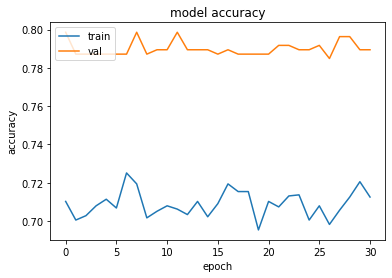

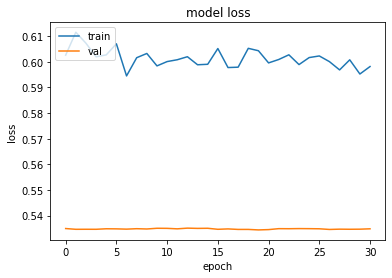

last model accuracy 0.7894737124443054
best model accuracy 0.7986270189285278


In [108]:
import matplotlib.pyplot as plt
import numpy as np


plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

index = np.argmax(history.history['val_accuracy'])

print('last model accuracy',history.history['val_accuracy'][-1])
print('best model accuracy',history.history['val_accuracy'][index])



In [109]:
model = K.models.load_model("pre-trained-features.h5")

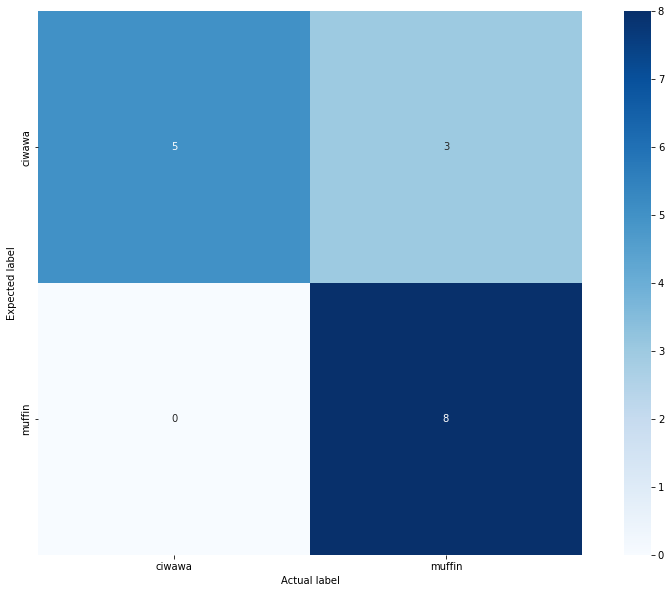

              precision    recall  f1-score   support

      ciwawa       1.00      0.62      0.77         8
      muffin       0.73      1.00      0.84         8

    accuracy                           0.81        16
   macro avg       0.86      0.81      0.81        16
weighted avg       0.86      0.81      0.81        16



,predictions,actual_values
0,ciwawa,ciwawa
1,ciwawa,ciwawa
2,ciwawa,ciwawa
3,muffin,ciwawa
4,ciwawa,ciwawa


,predictions,actual_values
3,muffin,ciwawa
5,muffin,ciwawa
6,muffin,ciwawa


n° of failing predictions: 3
accuracy: 0.8125


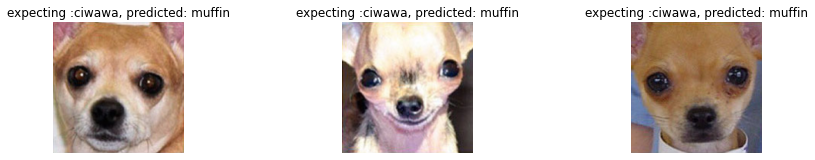

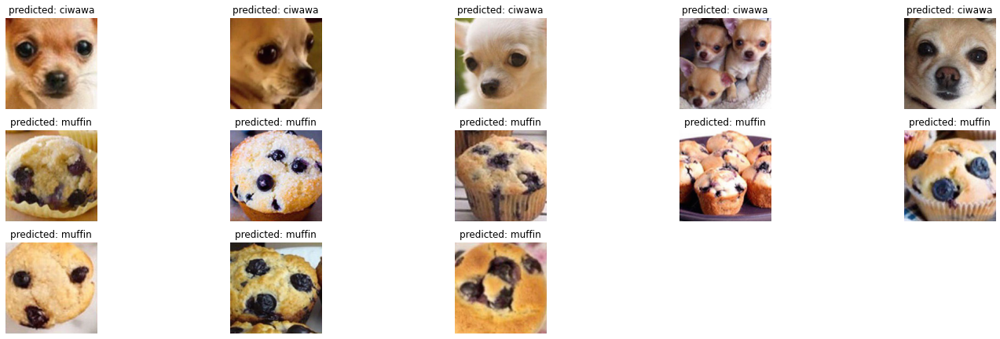

In [110]:
from sklearn.metrics import confusion_matrix,classification_report
import pandas as pd
import seaborn as sns
import tensorflow.keras as K

# labels = ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

pred = model.predict(test_features,len(X_test))

# print(pred[:,0])

predictions = (np.round(pred[:,0]))

# print(len(predictions))
# print(len(y_test))


df = pd.DataFrame({'predictions':predictions,'actual_values':y_test})

df['predictions']=df['predictions'].apply(lambda x: labels[int(x)] )
df['actual_values']=df['actual_values'].apply(lambda x: labels[x] ) 

expected = df['predictions'].to_numpy()
actual = df['actual_values'].to_numpy()

# # print(expected[:10])
# # print(actual[:10])

cm=confusion_matrix(actual,expected)

plt.figure(figsize=[15, 10])
sns.heatmap(data=cm, annot=True, cmap='Blues', square=True, xticklabels=labels, yticklabels=labels)
plt.xlabel('Actual label')
plt.ylabel('Expected label')
plt.show()

print( classification_report(actual,expected))

display(df.head())

failings = df[df['predictions']!=df['actual_values']]
corrects = df[df['predictions']==df['actual_values']]

display(failings.head())

failing_predictions = len(failings)

print('n° of failing predictions:',failing_predictions)
# print(failings.index[0])
total_data = len(df)

print('accuracy:',1 - failing_predictions / total_data)
# print('accuracy:',model.evaluate(X_test, y_test, batch_size=256))

fig = plt.figure(figsize=(20, 20))

columns = 5
rows = 10
total_pics = len(failings)
# print(failings.iloc[failings.index[0]])

# (X_train, y_train), (X_test, y_test) = K.datasets.cifar10.load_data()
for i in range(total_pics):
  if(i <total_pics):
    ax = fig.add_subplot(rows, columns, i+1)
  el = failings.iloc[i]
  ax.set_title('expecting :'+str(el.actual_values)+", predicted: "+str(el.predictions),fontsize=12)
  
  plt.imshow(X_test[failings.index[i]])
  plt.axis('off')
plt.tight_layout()

fig = plt.figure(figsize=(20, 20))

columns = 5
rows = 10
total_pics = len(corrects)

for i in range(total_pics):
  if(i <total_pics):
    ax = fig.add_subplot(rows, columns, i+1)
  el = corrects.iloc[i]
  ax.set_title("predicted: "+str(el.predictions),fontsize=12)
  
  plt.imshow(X_test[corrects.index[i]])
  plt.axis('off')
plt.tight_layout()

[0.75304693]
muffin


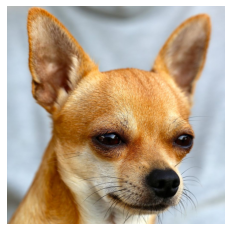

In [111]:
url = 'https://www.allevare.info/wp-content/uploads/2019/09/chihuahua-1.jpg'
# url = 'https://thumbs.dreamstime.com/b/funny-white-chihuahua-big-ears-funny-white-chihuahua-big-ears-bloosom-meadow-169312889.jpg'


image = io.imread(url)
plt.imshow(image)
plt.axis('off')


image = cv2.resize(image,(170,170))
image = image / 255

pred = cnn.predict(np.array([image]))

pred = model.predict(pred)
# index = np.argmax(pred)

index = int(np.round(pred[0]))

print(pred[0])
# print(index)
print(labels[index])